# Plotting questions

First I will generate some dummy data and show my existing plots.
Then I will outline my questions of how to improve these plots and keep them still interactive!

In [1]:
%pylab inline

import pandas as pd
import numpy as np
import seaborn as sns; sns.set()
import matplotlib.dates as mdates

aut_locator = mdates.AutoDateLocator(minticks=3, maxticks=7)
aut_formatter = mdates.ConciseDateFormatter(aut_locator)

import random
random_seed = 47
np.random.seed(random_seed)

random.seed(random_seed)

Populating the interactive namespace from numpy and matplotlib


## data generation

In [2]:
def generate_df_for_device(n_observations, n_metrics, device_id, geo_id, topology_id, cohort_id):
        df = pd.DataFrame(np.random.randn(n_observations,n_metrics), index=pd.date_range('2020', freq='H', periods=n_observations))
        df.columns = [f'metrik_{c}' for c in df.columns]
        df['geospatial_id'] = geo_id
        df['topology_id'] = topology_id
        df['cohort_id'] = cohort_id
        df['device_id'] = device_id
        return df
    
def generate_multi_device(n_observations, n_metrics, n_devices, cohort_levels, topo_levels):
    results = []
    for i in range(1, n_devices +1):
        #print(i)
        r = random.randrange(1, n_devices)
        cohort = random.randrange(1, cohort_levels)
        topo = random.randrange(1, topo_levels)
        df_single_dvice = generate_df_for_device(n_observations, n_metrics, i, r, topo, cohort)
        results.append(df_single_dvice)
        #print(r)
    return pd.concat(results)

# hourly data, 1 week of data
n_observations = 7 * 24
n_metrics = 3
n_devices = 20
cohort_levels = 3
topo_levels = 5

df = generate_multi_device(n_observations, n_metrics, n_devices, cohort_levels, topo_levels)
df = df.sort_index()
df = df.reset_index().rename(columns={'index':'hour'})
df['dt'] = df.hour.dt.date
df.head()

,hour,metrik_0,metrik_1,metrik_2,geospatial_id,topology_id,cohort_id,device_id,dt
0,2020-01-01,-0.848009,1.305906,0.924208,12,4,1,1,2020-01-01
1,2020-01-01,-0.516120,0.617011,0.623065,8,3,1,9,2020-01-01
2,2020-01-01,0.762399,-0.359898,-0.905238,19,3,2,13,2020-01-01
3,2020-01-01,0.708512,-1.502019,-2.677056,8,4,2,8,2020-01-01
4,2020-01-01,0.249475,0.590983,-0.677694,11,3,1,12,2020-01-01


In [3]:
marker_labels = pd.DataFrame({'cohort_id':[1,1, 1], 'marker_type':['a', 'b', 'a'], 'start':['2020-01-2', '2020-01-04 05', '2020-01-06'], 'end':[np.nan, '2020-01-05 16', np.nan]})
marker_labels['start'] = pd.to_datetime(marker_labels['start'])
marker_labels['end'] = pd.to_datetime(marker_labels['end'])
marker_labels.loc[marker_labels['end'].isnull(), 'end'] =  marker_labels.start + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)
marker_labels

,cohort_id,marker_type,start,end
0,1,a,2020-01-02 00:00:00,2020-01-02 23:59:59
1,1,b,2020-01-04 05:00:00,2020-01-05 16:00:00
2,1,a,2020-01-06 00:00:00,2020-01-06 23:59:59


## working exsisting plots

### Basic Label Plot

1


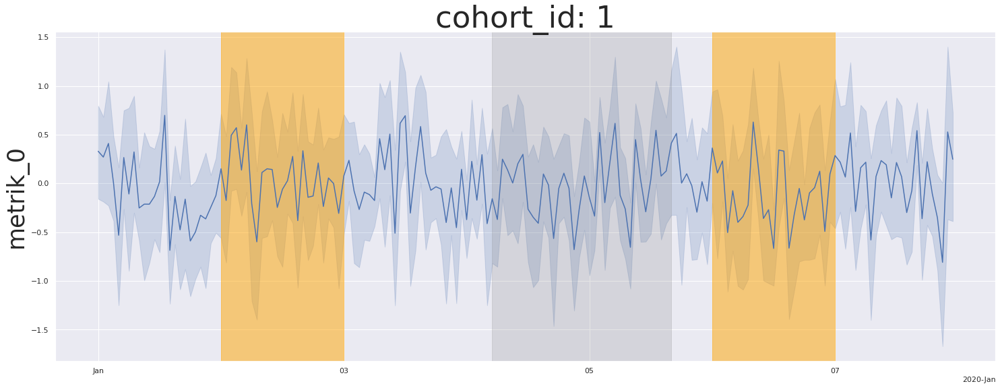

2


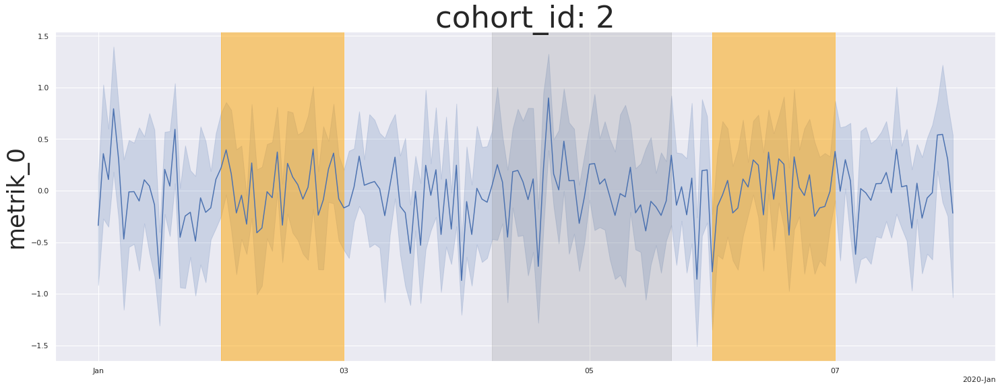

In [4]:
for cohort_id in sorted(df.cohort_id.unique()):
    print(cohort_id)
    figsize = (25, 9)
    fig, ax = plt.subplots(figsize=figsize)
    ax = sns.lineplot(x='hour', y='metrik_0', data=df[df.cohort_id == cohort_id], ax=ax)
    ax.xaxis.set_major_locator(aut_locator)
    ax.xaxis.set_major_formatter(aut_formatter)
    
    plt.title(f'cohort_id: {cohort_id}', fontsize=45)
    plt.xlabel('')
    plt.ylabel('metrik_0', fontsize=35)
    
    for index, row in marker_labels.iterrows():
        start = row.start
        end = row.end
        marker_type = row.marker_type
        if marker_type == 'b':
            ax.axvspan(start, end, color='gray', alpha=0.2)
        else:
            ax.axvspan(start, end, color='orange', alpha=0.5)
        
    plt.show()



### Basic interactive plot

Variant 1: multiple metrics

In [5]:
metrik_columns = df.columns[df.columns.str.contains('metrik')].to_list()
metrik_columns

['metrik_0', 'metrik_1', 'metrik_2']

In [6]:
width=1200
height=500

import holoviews as hv
import hvplot.pandas

for cohort_id in sorted(df.cohort_id.unique()):
    print(cohort_id)
    current_plot = df[df.cohort_id == cohort_id].set_index(['hour'])[metrik_columns].hvplot(width=width, height=height).opts(active_tools=['box_zoom'])
    
    for index, row in marker_labels.iterrows():
        start = row.start
        end = row.end
        marker_type = row.marker_type
        vspan = hv.VSpan(start, end)

        if marker_type == 'b':
            current_plot = current_plot * vspan.opts(color='grey', alpha=0.2)
        else:
            current_plot = current_plot * vspan.opts(color='orange', alpha=0.4)
            
    display(current_plot)

1


:Overlay
   .NdOverlay.I :NdOverlay   [Variable]
      :Curve   [hour]   (value)
   .VSpan.I     :VSpan   [x,y]
   .VSpan.II    :VSpan   [x,y]
   .VSpan.III   :VSpan   [x,y]

2


:Overlay
   .NdOverlay.I :NdOverlay   [Variable]
      :Curve   [hour]   (value)
   .VSpan.I     :VSpan   [x,y]
   .VSpan.II    :VSpan   [x,y]
   .VSpan.III   :VSpan   [x,y]

Variant 2: single metrik for the different devices

In [7]:
for cohort_id in sorted(df.cohort_id.unique()):
    print(cohort_id)
    current_plot = df[df.cohort_id == cohort_id].set_index(['hour'])[['metrik_0', 'device_id']].hvplot(by='device_id', width=width, height=height).opts(active_tools=['box_zoom'])
    
    for index, row in marker_labels.iterrows():
        start = row.start
        end = row.end
        marker_type = row.marker_type
        vspan = hv.VSpan(start, end)

        if marker_type == 'b':
            current_plot = current_plot * vspan.opts(color='grey', alpha=0.2)
        else:
            current_plot = current_plot * vspan.opts(color='orange', alpha=0.4)
            
    display(current_plot)

1


:Overlay
   .NdOverlay.I :NdOverlay   [device_id]
      :Curve   [hour]   (metrik_0)
   .VSpan.I     :VSpan   [x,y]
   .VSpan.II    :VSpan   [x,y]
   .VSpan.III   :VSpan   [x,y]

2


:Overlay
   .NdOverlay.I :NdOverlay   [device_id]
      :Curve   [hour]   (metrik_0)
   .VSpan.I     :VSpan   [x,y]
   .VSpan.II    :VSpan   [x,y]
   .VSpan.III   :VSpan   [x,y]

**Question 1:**

How can I move the legend of the interactive plot down and also display more than a single column? I could not get it to work so far https://github.com/holoviz/holoviews/issues/3780

### Basic cycleplot

1


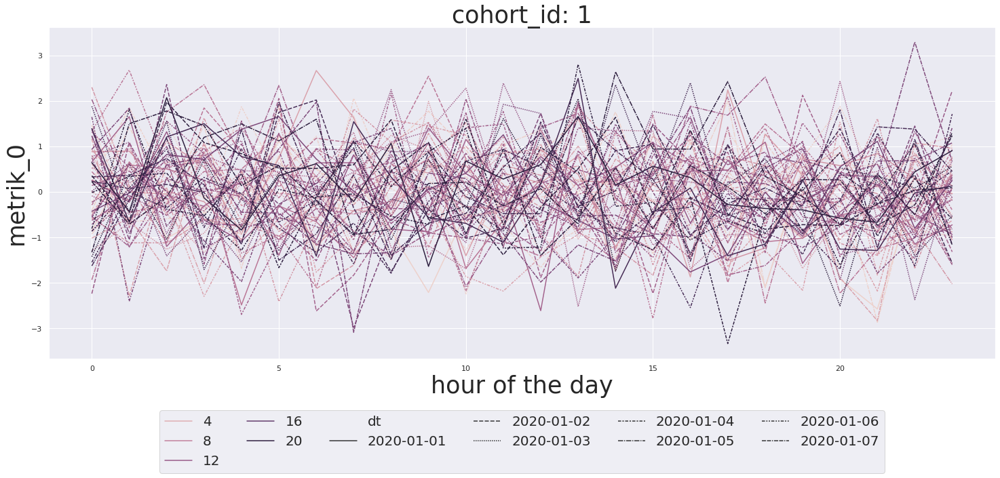

2


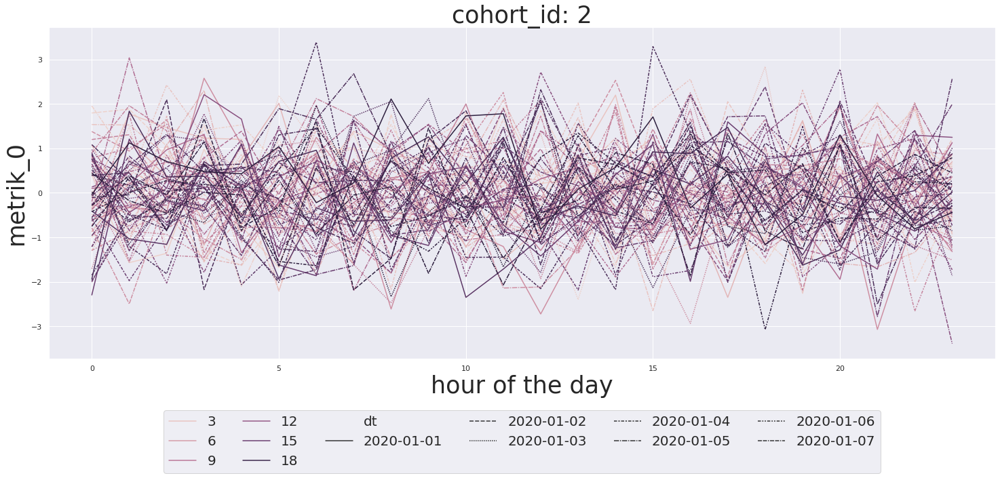

In [8]:
for cohort_id in sorted(df.cohort_id.unique()):
    print(cohort_id)
    
    figsize = (25, 9)
    fig, ax = plt.subplots(figsize=figsize)
    a1 = sns.lineplot(x=df['hour'].dt.hour, y='metrik_0', hue='device_id', units='dt', style='dt', estimator=None, data=df[(df.cohort_id == cohort_id)], ax=ax)
    handles, labels = a1.get_legend_handles_labels()
    a1.legend(handles=handles[1:], labels=labels[1:], loc='center', bbox_to_anchor=(0.5, -0.25), ncol=6, fontsize=20)

    plt.title(f'cohort_id: {cohort_id}', fontsize=35)
    plt.xlabel('hour of the day', fontsize=35)
    plt.ylabel('metrik_0', fontsize=35)
    plt.show()

**Question 2:**

How can I choose a single color for the lines (maybe separate them by style per device) but highlight the individual lines / time segments of the lines with a matching ticket in i.e. red.
    
**Question 3:**

How can I create an interactive plot like the one above (for the periodicities) which also encompasses Question 2

### Scatterplots of a large quantity of points - with legend

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
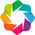

:DynamicMap   []
   :Overlay
      .RGB.I         :RGB   [metrik_0,metrik_1]   (R,G,B,A)
      .NdOverlay.A_1 :NdOverlay   [Element]
         :Points   [x,y]

In [9]:
import datashader as ds
import datashader.transfer_functions as tf

import holoviews as hv
from holoviews.operation.datashader import datashade
hv.extension('bokeh')
from datashader.colors import Sets1to3

lab_s = df.cohort_id.unique()
color_key = [(name,color) for name,color in zip(lab_s, Sets1to3)]
color_points = hv.NdOverlay({n: hv.Points([0,0], label=str(n)).opts(style=dict(color=c)) for n,c in color_key})
datashade(hv.Points(df, kdims=['metrik_0', 'metrik_1'], vdims=['cohort_id']), aggregator=ds.count_cat('cohort_id') , color_key=Sets1to3).opts(width=width, height=height) * color_points